In [ ]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

import keras
from keras import layers
from keras import ops

AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
# Download DIV2K from TF Datasets
# Using bicubic 4x degradation type
div2k_data = tfds.image.Div2k(config="bicubic_x4")
div2k_data.download_and_prepare()

# Taking train data from div2k_data object
train = div2k_data.as_dataset(split="train", as_supervised=True)
train_cache = train.cache()
# Validation data
val = div2k_data.as_dataset(split="validation", as_supervised=True)
val_cache = val.cache()

In [ ]:
def flip_left_right(lowres_img, highres_img):
    """Flips Images to left and right."""

    # Outputs random values from a uniform distribution in between 0 to 1
    rn = keras.random.uniform(shape=(), maxval=1)
    # If rn is less than 0.5 it returns original lowres_img and highres_img
    # If rn is greater than 0.5 it returns flipped image
    return ops.cond(
        rn < 0.5,
        lambda: (lowres_img, highres_img),
        lambda: (
            ops.flip(lowres_img),
            ops.flip(highres_img),
        ),
    )

In [ ]:
def random_rotate(lowres_img, highres_img):
    """Rotates Images by 90 degrees."""

    # Outputs random values from uniform distribution in between 0 to 4
    rn = ops.cast(
        keras.random.uniform(shape=(), maxval=4, dtype="float32"), dtype="int32"
    )
    # Here rn signifies number of times the image(s) are rotated by 90 degrees
    return tf.image.rot90(lowres_img, rn), tf.image.rot90(highres_img, rn)

In [ ]:
def random_crop(lowres_img, highres_img, hr_crop_size=96, scale=4):
    """Crop images.

    low resolution images: 24x24
    high resolution images: 96x96
    """
    lowres_crop_size = hr_crop_size // scale  # 96//4=24
    lowres_img_shape = ops.shape(lowres_img)[:2]  # (height,width)

    lowres_width = ops.cast(
        keras.random.uniform(
            shape=(), maxval=lowres_img_shape[1] - lowres_crop_size + 1, dtype="float32"
        ),
        dtype="int32",
    )
    lowres_height = ops.cast(
        keras.random.uniform(
            shape=(), maxval=lowres_img_shape[0] - lowres_crop_size + 1, dtype="float32"
        ),
        dtype="int32",
    )

    highres_width = lowres_width * scale
    highres_height = lowres_height * scale

    lowres_img_cropped = lowres_img[
        lowres_height : lowres_height + lowres_crop_size,
        lowres_width : lowres_width + lowres_crop_size,
    ]  # 24x24
    highres_img_cropped = highres_img[
        highres_height : highres_height + hr_crop_size,
        highres_width : highres_width + hr_crop_size,
    ]  # 96x96

    return lowres_img_cropped, highres_img_cropped

In [ ]:
def dataset_object(dataset_cache, training=True):
    ds = dataset_cache
    ds = ds.map(
        lambda lowres, highres: random_crop(lowres, highres, scale=4),
        num_parallel_calls=AUTOTUNE,
    )

    if training:
        ds = ds.map(random_rotate, num_parallel_calls=AUTOTUNE)
        ds = ds.map(flip_left_right, num_parallel_calls=AUTOTUNE)
    # Batching Data
    ds = ds.batch(16)

    if training:
        # Repeating Data, so that cardinality if dataset becomes infinte
        ds = ds.repeat()
    # prefetching allows later images to be prepared while the current image is being processed
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

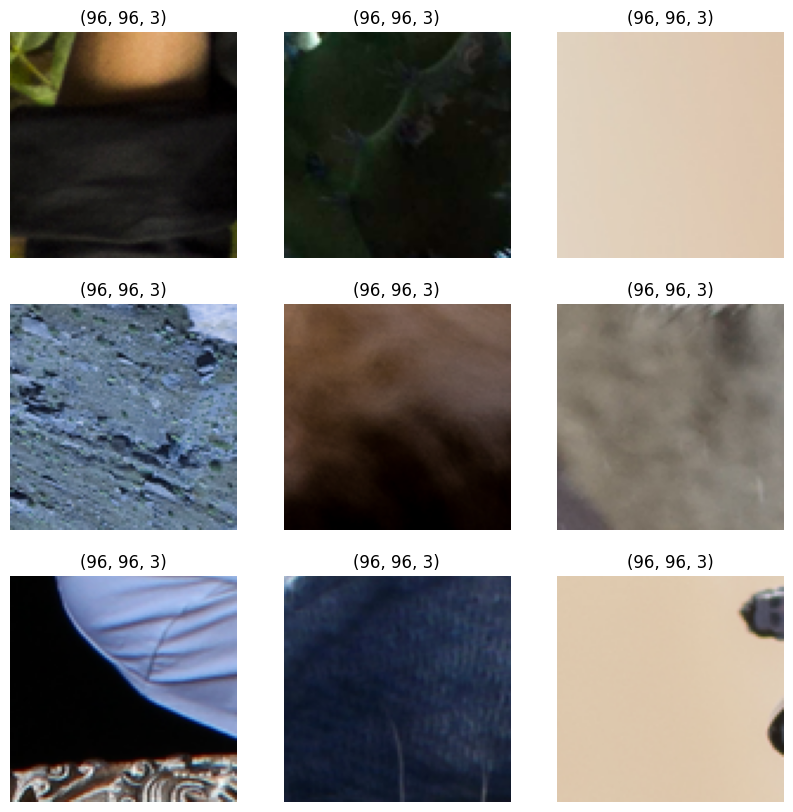

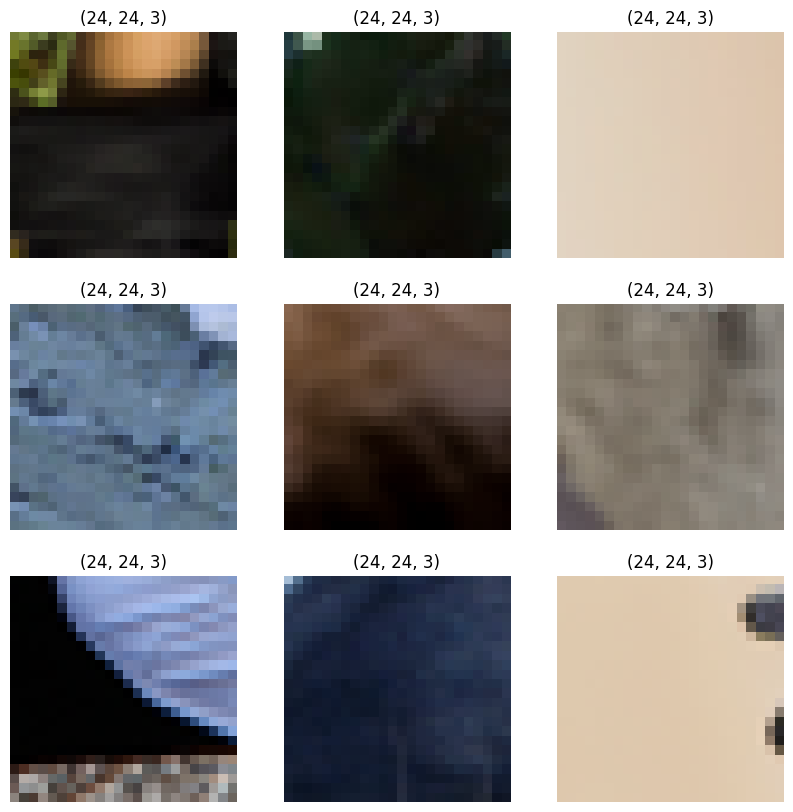

In [ ]:
train_ds = dataset_object(train_cache, training=True)
val_ds = dataset_object(val_cache, training=False)

"""
## Visualize the data

Let's visualize a few sample images:
"""

lowres, highres = next(iter(train_ds))

# High Resolution Images
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(highres[i].numpy().astype("uint8"))
    plt.title(highres[i].shape)
    plt.axis("off")

# Low Resolution Images
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(lowres[i].numpy().astype("uint8"))
    plt.title(lowres[i].shape)
    plt.axis("off")


In [ ]:
def PSNR(super_resolution, high_resolution):
    """Compute the peak signal-to-noise ratio, measures quality of image."""
    # Max value of pixel is 255
    psnr_value = tf.image.psnr(high_resolution, super_resolution, max_val=255)[0]
    return psnr_value

In [ ]:
class EDSRModel(keras.Model):
    def train_step(self, data):
        # Unpack the data. Its structure depends on your model and
        # on what you pass to `fit()`.
        x, y = data

        with tf.GradientTape() as tape:
            y_pred = self(x, training=True)  # Forward pass
            # Compute the loss value
            # (the loss function is configured in `compile()`)
            loss = self.compiled_loss(y, y_pred, regularization_losses=self.losses)

        # Compute gradients
        trainable_vars = self.trainable_variables
        gradients = tape.gradient(loss, trainable_vars)
        # Update weights
        self.optimizer.apply_gradients(zip(gradients, trainable_vars))
        # Update metrics (includes the metric that tracks the loss)
        self.compiled_metrics.update_state(y, y_pred)
        # Return a dict mapping metric names to current value
        return {m.name: m.result() for m in self.metrics}

    def predict_step(self, x):
        # Adding dummy dimension using tf.expand_dims and converting to float32 using tf.cast
        x = ops.cast(tf.expand_dims(x, axis=0), dtype="float32")
        # Passing low resolution image to model
        super_resolution_img = self(x, training=False)
        # Clips the tensor from min(0) to max(255)
        super_resolution_img = ops.clip(super_resolution_img, 0, 255)
        # Rounds the values of a tensor to the nearest integer
        super_resolution_img = ops.round(super_resolution_img)
        # Removes dimensions of size 1 from the shape of a tensor and converting to uint8
        super_resolution_img = ops.squeeze(
            ops.cast(super_resolution_img, dtype="uint8"), axis=0
        )
        return super_resolution_img


In [ ]:
# Residual Block
def ResBlock(inputs):
    x = layers.Conv2D(64, 3, padding="same", activation="relu")(inputs)
    x = layers.Conv2D(64, 3, padding="same")(x)
    x = layers.Add()([inputs, x])
    return x


# Upsampling Block
def Upsampling(inputs, factor=2, **kwargs):
    x = layers.Conv2D(64 * (factor**2), 3, padding="same", **kwargs)(inputs)
    x = layers.Lambda(lambda x: tf.nn.depth_to_space(x, block_size=factor))(x)
    x = layers.Conv2D(64 * (factor**2), 3, padding="same", **kwargs)(x)
    x = layers.Lambda(lambda x: tf.nn.depth_to_space(x, block_size=factor))(x)
    return x


def make_model(num_filters, num_of_residual_blocks):
    # Flexible Inputs to input_layer
    input_layer = layers.Input(shape=(None, None, 3))
    # Scaling Pixel Values
    x = layers.Rescaling(scale=1.0 / 255)(input_layer)
    x = x_new = layers.Conv2D(num_filters, 3, padding="same")(x)

    # 16 residual blocks
    for _ in range(num_of_residual_blocks):
        x_new = ResBlock(x_new)

    x_new = layers.Conv2D(num_filters, 3, padding="same")(x_new)
    x = layers.Add()([x, x_new])

    x = Upsampling(x)
    x = layers.Conv2D(3, 3, padding="same")(x)

    output_layer = layers.Rescaling(scale=255)(x)
    return EDSRModel(input_layer, output_layer)

In [ ]:
model = make_model(num_filters=64, num_of_residual_blocks=16)

"""
## Train the model
"""

# Using adam optimizer with initial learning rate as 1e-4, changing learning rate after 5000 steps to 5e-5
optim_edsr = keras.optimizers.Adam(
    learning_rate=keras.optimizers.schedules.PiecewiseConstantDecay(
        boundaries=[5000], values=[1e-4, 5e-5]
    )
)
# Compiling model with loss as mean absolute error(L1 Loss) and metric as psnr
model.compile(optimizer=optim_edsr, loss="mae", metrics=[PSNR])
# Training for more epochs will improve results
model.fit(train_ds, epochs=10, steps_per_epoch=20, validation_data=val_ds)

Epoch 1/10


/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/trainer.py:671: UserWarning: `model.compiled_loss()` is deprecated. Instead, use `model.compute_loss(x, y, y_pred, sample_weight, training)`.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/trainer.py:646: UserWarning: `model.compiled_metrics()` is deprecated. Instead, use e.g.:
```
for metric in self.metrics:
    metric.update_state(y, y_pred)
```

  return self._compiled_metrics_update_state(


20/20 ━━━━━━━━━━━━━━━━━━━━ 71s 3s/step - psnr: 8.1747 - loss: 62.5190 - val_loss: 39.9989 - val_psnr: 10.4815
Epoch 2/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 51s 3s/step - psnr: 10.1766 - loss: 95.0238 - val_loss: 30.8742 - val_psnr: 7.9126
Epoch 3/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - psnr: 5.1315 - loss: 108.8343 - val_loss: 24.8377 - val_psnr: 9.3597
Epoch 4/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - psnr: 11.6575 - loss: 100.6321 - val_loss: 20.8568 - val_psnr: 7.2235
Epoch 5/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - psnr: 9.1556 - loss: 107.9008 - val_loss: 19.0272 - val_psnr: 6.6859
Epoch 6/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - psnr: 8.1558 - loss: 103.9718 - val_loss: 19.4958 - val_psnr: 7.6056
Epoch 7/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - psnr: 5.3206 - loss: 108.8562 - val_loss: 16.0840 - val_psnr: 6.6222
Epoch 8/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - psnr: 7.2224 - loss: 110.7806 - val_loss: 14.7987 - val_psnr: 9.1841
Epoch 9/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 37s 

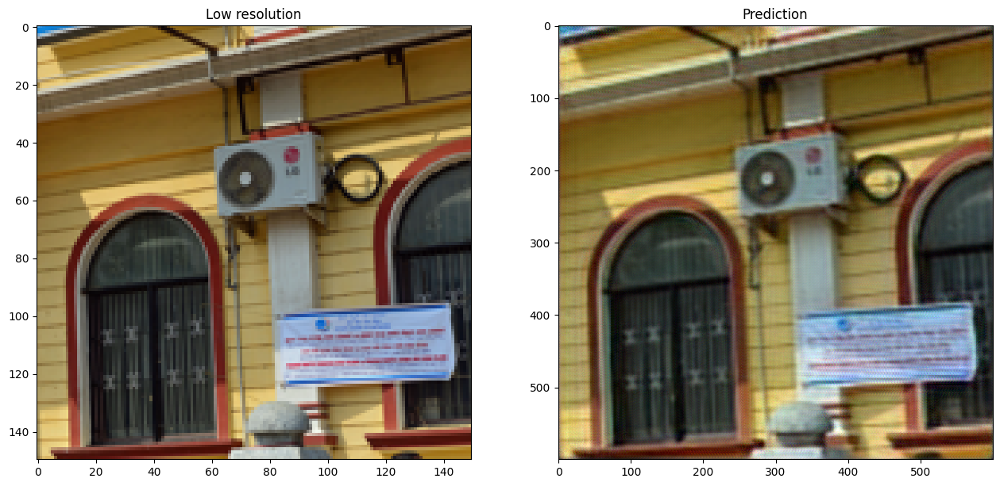

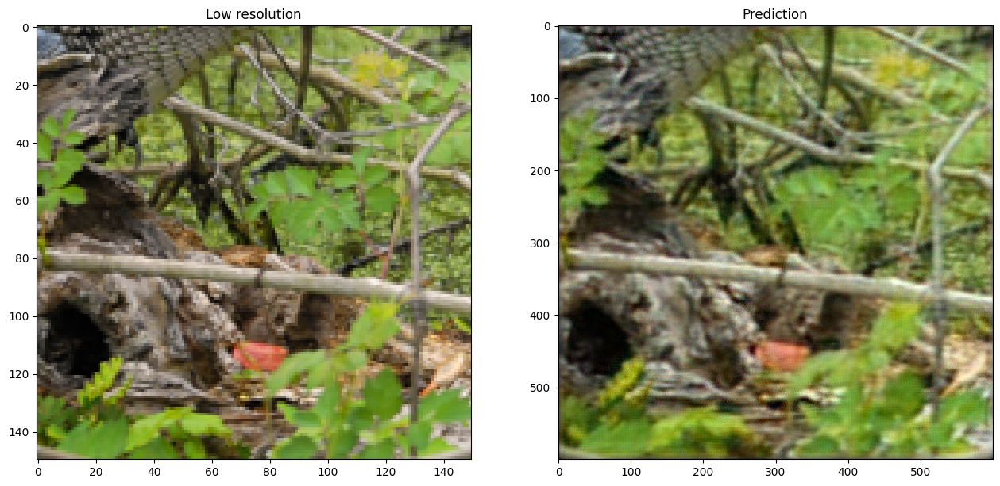

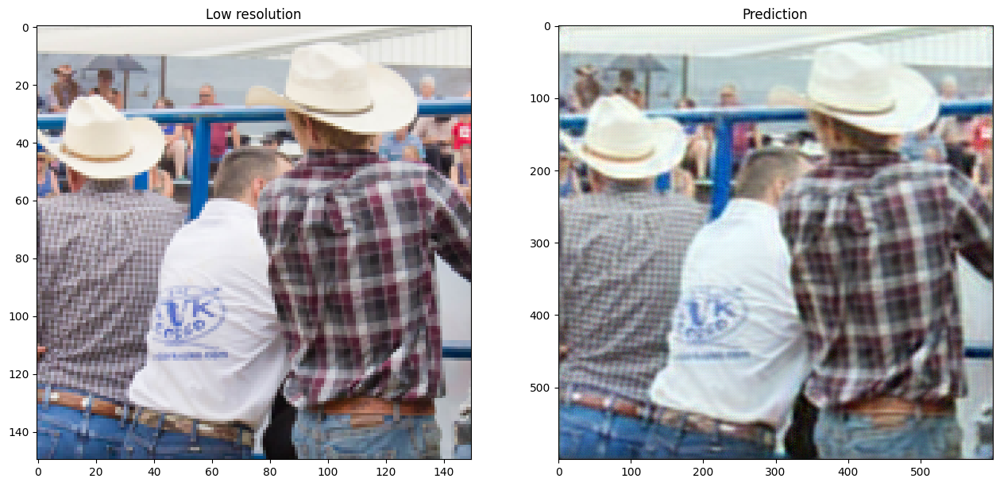

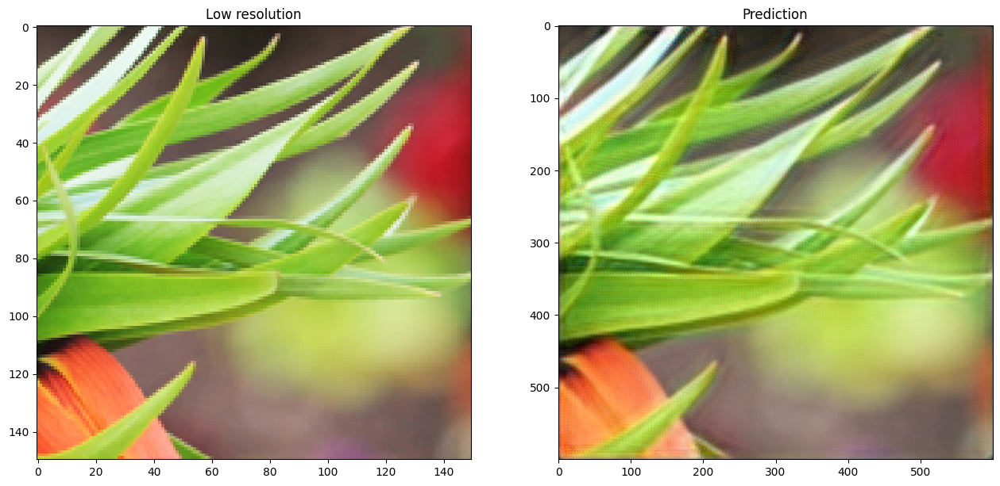

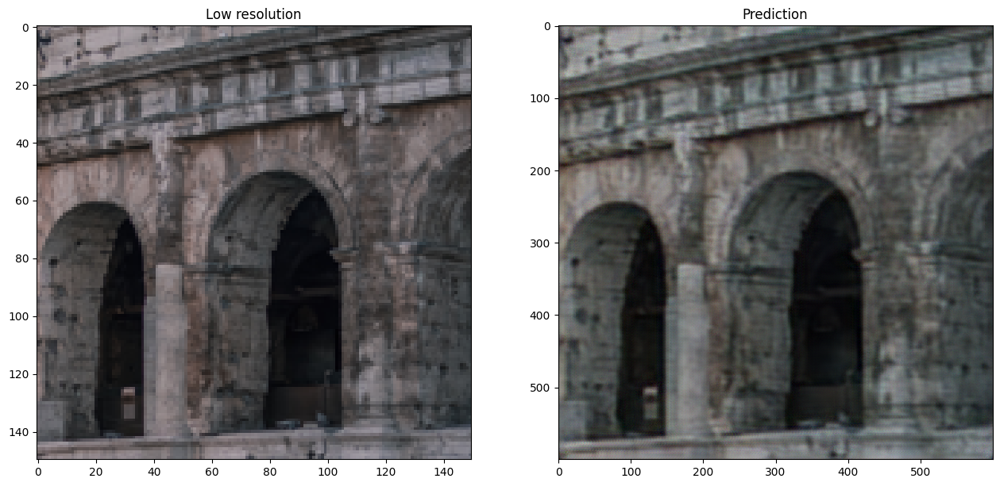

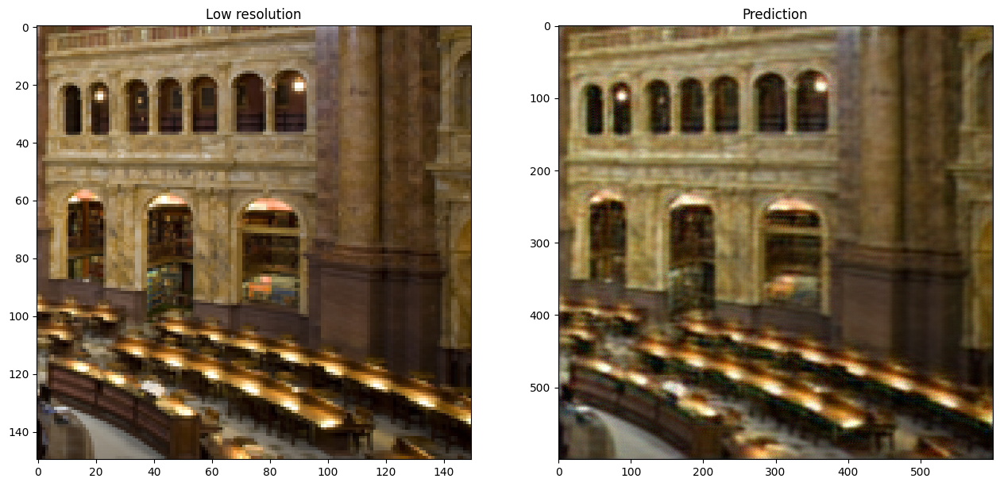

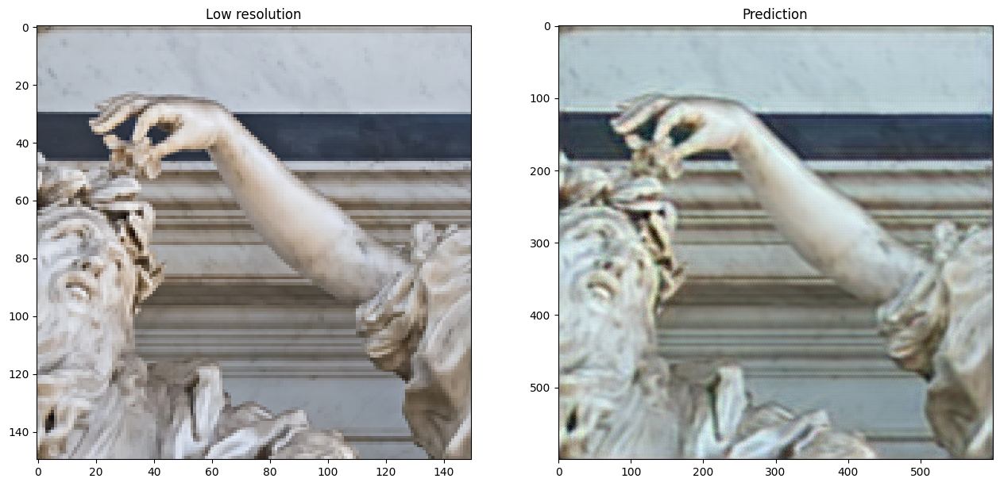

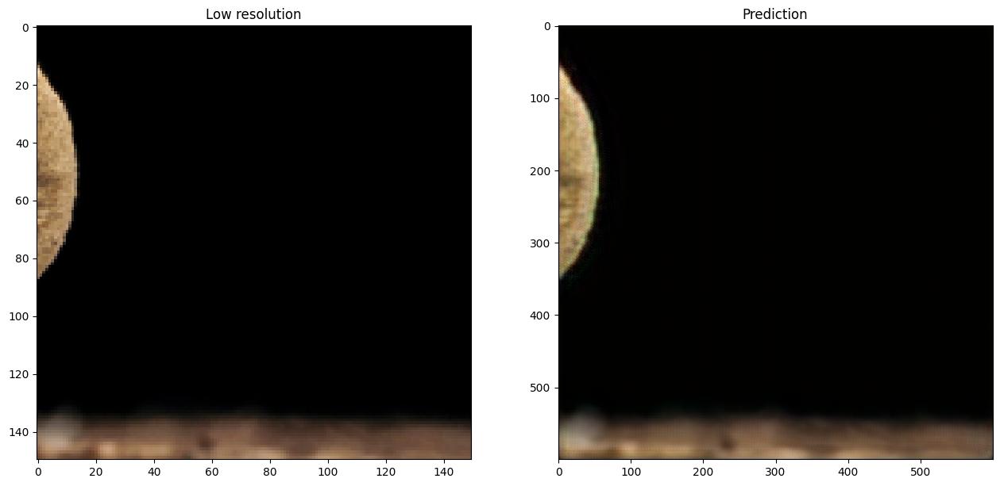

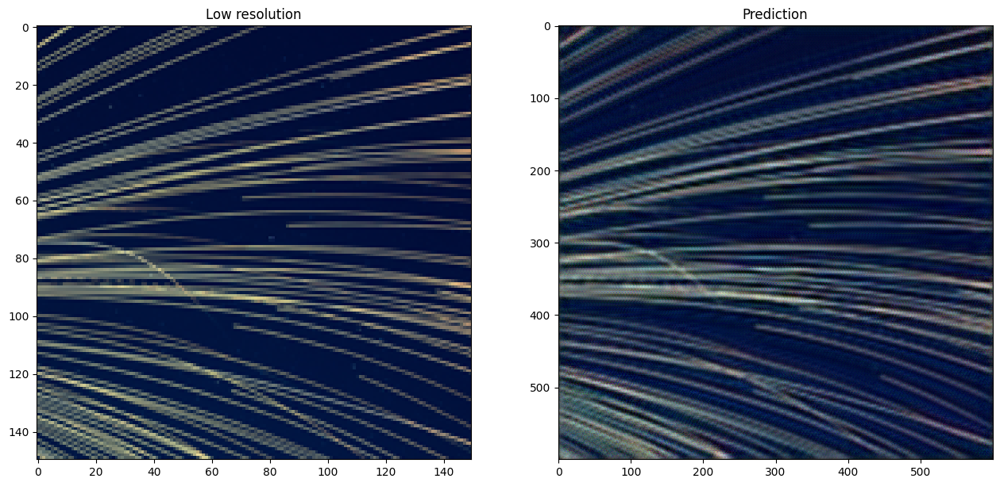

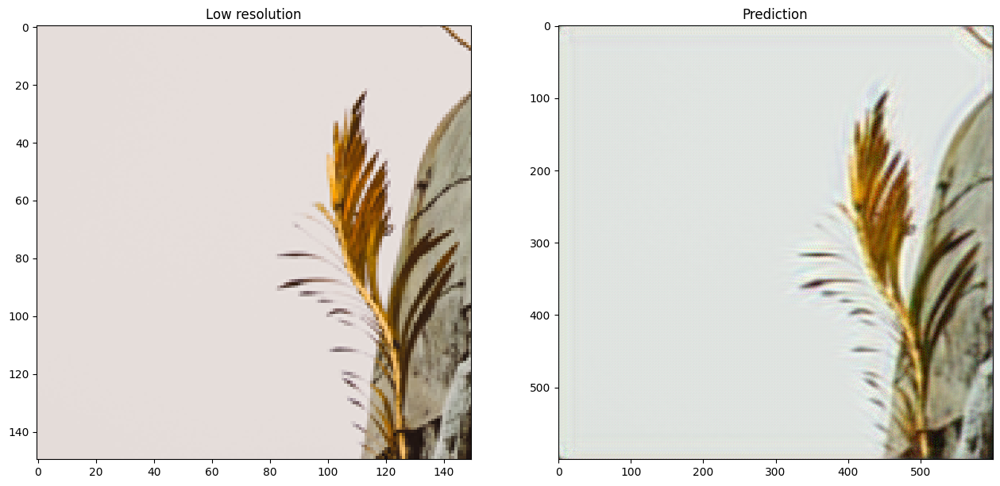

In [ ]:
def plot_results(lowres, preds):
    """
    Displays low resolution image and super resolution image
    """
    plt.figure(figsize=(24, 14))
    plt.subplot(132), plt.imshow(lowres), plt.title("Low resolution")
    plt.subplot(133), plt.imshow(preds), plt.title("Prediction")
    plt.show()


for lowres, highres in val.take(10):
    lowres = tf.image.random_crop(lowres, (150, 150, 3))
    preds = model.predict_step(lowres)
    plot_results(lowres, preds)